# 06 - Validazione Quantitativa Grad-CAM++

Validazione delle saliency map Grad-CAM++ usando il DDR dataset con annotazioni pixel-level delle lesioni.

**Obiettivi**:
- Calcolare IoU tra heatmap e maschere di lesioni reali
- Valutare Pointing Game Accuracy
- Analizzare performance per tipo di lesione (MA, HE, EX, SE)

**Dataset**: DDR (Diabetic Retinopathy Detection)
- 149 immagini validation con segmentazione pixel-level
- Tipi lesione: Microaneurismi, Emorragie, Essudati Duri, Essudati Molli

## 1. Setup

In [2]:
import os
import sys
from pathlib import Path
import warnings
warnings.filterwarnings('ignore')

# Manipolazione dati
import pandas as pd
import numpy as np
from PIL import Image

# Configurazione
import yaml

# Deep Learning
import torch
import torch.nn as nn
import torch.nn.functional as F

# Modelli
import timm

# Elaborazione immagini
import cv2
import albumentations as A
from albumentations.pytorch import ToTensorV2

# Visualizzazione
import matplotlib.pyplot as plt
import matplotlib.cm as cm

# Metriche
from scipy import ndimage

# Progress bar
from tqdm.auto import tqdm

# Impostazioni visualizzazione
plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['font.size'] = 11

print(f"PyTorch version: {torch.__version__}")
print(f"CUDA disponibile: {torch.cuda.is_available()}")

PyTorch version: 2.9.1+cu130
CUDA disponibile: True


In [3]:
def get_project_root():
    """
    Rileva la root del progetto.
    """
    notebook_dir = Path.cwd()
    if notebook_dir.name == 'notebooks':
        return notebook_dir.parent
    current = notebook_dir
    for _ in range(5):
        if (current / 'Data').exists():
            return current
        current = current.parent
    if sys.platform == 'linux' and Path('/mnt/c').exists():
        return Path('/mnt/c/Repository/multi-method-xai-diabetic-retinopathy')
    return Path('C:/Repository/multi-method-xai-diabetic-retinopathy')


PROJECT_ROOT = get_project_root()
print(f"Project root: {PROJECT_ROOT}")

Project root: /mnt/c/Repository/multi-method-xai-diabetic-retinopathy


In [4]:
# Caricamento configurazione
config_path = PROJECT_ROOT / 'config.yaml'
with open(config_path, 'r') as f:
    config = yaml.safe_load(f)

# Paths
CHECKPOINTS_DIR = PROJECT_ROOT / config['paths']['checkpoints_dir']
RESULTS_DIR = PROJECT_ROOT / config['paths']['results_dir']
PROCESSED_DIR = PROJECT_ROOT / config['paths']['processed_dir']

# DDR Dataset paths
DDR_BASE = PROJECT_ROOT / 'Data' / 'DDR Dataset' / 'DDR-dataset' / 'lesion_segmentation'
DDR_VALID_IMAGES = DDR_BASE / 'valid' / 'image'
DDR_VALID_LABELS = DDR_BASE / 'valid' / 'segmentation label'

# Device
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Device: {DEVICE}")

# Model config
MODEL_CONFIG = config['model']
NUM_CLASSES = MODEL_CONFIG['num_classes']
CLASS_NAMES = MODEL_CONFIG['class_names']

# Grad-CAM config
GRADCAM_CONFIG = config['explainability']['gradcam']
TARGET_LAYER = GRADCAM_CONFIG['target_layer']

# Output directory
VALIDATION_DIR = RESULTS_DIR / 'gradcam_validation'
VALIDATION_DIR.mkdir(parents=True, exist_ok=True)

# Tipi di lesione DDR
LESION_TYPES = ['EX', 'HE', 'MA', 'SE']
LESION_NAMES = {
    'EX': 'Essudati Duri',
    'HE': 'Emorragie',
    'MA': 'Microaneurismi',
    'SE': 'Essudati Molli'
}

# Seed
SEED = config['seed']
np.random.seed(SEED)
torch.manual_seed(SEED)

print(f"\nDDR Dataset: {DDR_BASE}")
print(f"Processed Dir: {PROCESSED_DIR}")
print(f"Target layer: {TARGET_LAYER}")
print(f"Output: {VALIDATION_DIR}")

Device: cuda

DDR Dataset: /mnt/c/Repository/multi-method-xai-diabetic-retinopathy/Data/DDR Dataset/DDR-dataset/lesion_segmentation
Processed Dir: /mnt/c/Repository/multi-method-xai-diabetic-retinopathy/Data/processed
Target layer: blocks.5
Output: /mnt/c/Repository/multi-method-xai-diabetic-retinopathy/results/gradcam_validation


In [5]:
# Carica modello
def find_best_checkpoint(checkpoints_dir):
    """
    Trova il checkpoint con il miglior score.
    """
    checkpoints = list(Path(checkpoints_dir).glob('best_model_*.pt'))
    if not checkpoints:
        raise FileNotFoundError(f"Nessun checkpoint trovato in {checkpoints_dir}")
    return max(checkpoints, key=lambda p: p.stat().st_mtime)


checkpoint_path = find_best_checkpoint(CHECKPOINTS_DIR)
print(f"Checkpoint: {checkpoint_path.name}")

checkpoint = torch.load(checkpoint_path, map_location=DEVICE, weights_only=False)
print(f"Epoca: {checkpoint['epoch']}, Best score: {checkpoint['best_score']:.4f}")

# Crea modello
model = timm.create_model(
    MODEL_CONFIG['architecture'],
    pretrained=False,
    num_classes=NUM_CLASSES,
    drop_rate=MODEL_CONFIG['dropout_rate']
)
model.load_state_dict(checkpoint['model_state_dict'])
model = model.to(DEVICE)
model.eval()

print(f"Modello caricato: {MODEL_CONFIG['architecture']}")

Checkpoint: best_model_20260118_134510.pt
Epoca: 8, Best score: 0.9023
Modello caricato: efficientnet_b5


## 2. Preparazione DDR Dataset

In [6]:
def load_ddr_dataset(images_dir, labels_dir, lesion_types):
    """
    Carica il DDR dataset con annotazioni lesioni.
    
    Args:
        images_dir: Directory immagini
        labels_dir: Directory maschere segmentazione
        lesion_types: Lista tipi lesione (EX, HE, MA, SE)
        
    Returns:
        DataFrame con paths immagini e maschere
    """
    records = []
    
    # Lista immagini
    image_files = sorted(images_dir.glob('*.jpg'))
    
    for img_path in image_files:
        img_name = img_path.stem
        
        record = {
            'image_path': str(img_path),
            'image_name': img_name
        }
        
        # Verifica esistenza maschere per ogni tipo lesione
        has_any_lesion = False
        for lesion_type in lesion_types:
            mask_path = labels_dir / lesion_type / f"{img_name}.tif"
            if mask_path.exists():
                record[f'mask_{lesion_type}'] = str(mask_path)
                has_any_lesion = True
            else:
                record[f'mask_{lesion_type}'] = None
        
        if has_any_lesion:
            records.append(record)
    
    return pd.DataFrame(records)


# Carica dataset
ddr_df = load_ddr_dataset(DDR_VALID_IMAGES, DDR_VALID_LABELS, LESION_TYPES)
print(f"DDR Validation: {len(ddr_df)} immagini")

# Verifica maschere disponibili
print(f"\nMaschere disponibili:")
for lt in LESION_TYPES:
    count = ddr_df[f'mask_{lt}'].notna().sum()
    print(f"  {lt} ({LESION_NAMES[lt]}): {count}")

DDR Validation: 149 immagini

Maschere disponibili:
  EX (Essudati Duri): 149
  HE (Emorragie): 149
  MA (Microaneurismi): 149
  SE (Essudati Molli): 149


In [7]:
def load_lesion_mask(mask_path):
    """
    Carica maschera lesione da file .tif.
    
    Args:
        mask_path: Path al file .tif
        
    Returns:
        mask: Array binario (H, W) con 1=lesione, 0=background
    """
    if mask_path is None or pd.isna(mask_path):
        return None
    
    mask = np.array(Image.open(mask_path))
    
    # Converti a binario (alcuni .tif hanno valori 0-255)
    if mask.max() > 1:
        mask = (mask > 127).astype(np.uint8)
    else:
        mask = mask.astype(np.uint8)
    
    return mask


def combine_lesion_masks(row, lesion_types):
    """
    Combina tutte le maschere lesione in una singola maschera.
    
    Args:
        row: Riga DataFrame con paths maschere
        lesion_types: Lista tipi lesione
        
    Returns:
        combined: Maschera combinata (OR di tutte le lesioni)
        individual: Dict con maschere individuali
    """
    individual = {}
    combined = None
    
    for lt in lesion_types:
        mask = load_lesion_mask(row.get(f'mask_{lt}'))
        if mask is not None:
            individual[lt] = mask
            if combined is None:
                combined = mask.copy()
            else:
                combined = np.maximum(combined, mask)
    
    return combined, individual


# Test caricamento maschera
test_row = ddr_df.iloc[0]
test_combined, test_individual = combine_lesion_masks(test_row, LESION_TYPES)

print(f"Test maschera combinata shape: {test_combined.shape if test_combined is not None else 'None'}")
print(f"Lesioni presenti: {list(test_individual.keys())}")

Test maschera combinata shape: (1824, 2736)
Lesioni presenti: ['EX', 'HE', 'MA', 'SE']


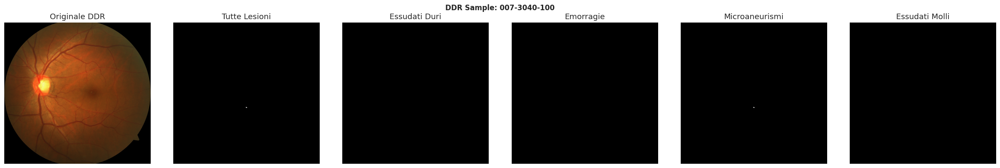

In [8]:
# Visualizza esempio DDR con maschere
sample_idx = 10
sample_row = ddr_df.iloc[sample_idx]

# Carica immagine
sample_img = cv2.imread(sample_row['image_path'])
sample_img = cv2.cvtColor(sample_img, cv2.COLOR_BGR2RGB)

# Carica maschere
combined_mask, individual_masks = combine_lesion_masks(sample_row, LESION_TYPES)

# Visualizza
n_masks = len(individual_masks) + 2  # originale + combinata + individuali
fig, axes = plt.subplots(1, n_masks, figsize=(n_masks * 4, 4))

# Originale
axes[0].imshow(sample_img)
axes[0].set_title('Originale DDR')
axes[0].axis('off')

# Maschera combinata
if combined_mask is not None:
    axes[1].imshow(combined_mask, cmap='gray')
    axes[1].set_title('Tutte Lesioni')
axes[1].axis('off')

# Maschere individuali
for i, (lt, mask) in enumerate(individual_masks.items()):
    axes[i + 2].imshow(mask, cmap='gray')
    axes[i + 2].set_title(f'{LESION_NAMES[lt]}')
    axes[i + 2].axis('off')

plt.suptitle(f'DDR Sample: {sample_row["image_name"]}', fontsize=12, fontweight='bold')
plt.tight_layout()
plt.show()

## 3. Grad-CAM++ e Preprocessing

In [9]:
class GradCAMPlusPlus:
    """
    Implementazione di Grad-CAM++ per EfficientNet.
    """
    
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        self.hooks = []
        self._register_hooks()
    
    def _get_target_layer(self):
        modules = dict(self.model.named_modules())
        if self.target_layer in modules:
            return modules[self.target_layer]
        raise ValueError(f"Layer '{self.target_layer}' non trovato")
    
    def _register_hooks(self):
        target = self._get_target_layer()
        
        def forward_hook(module, input, output):
            self.activations = output.detach()
        
        def backward_hook(module, grad_input, grad_output):
            self.gradients = grad_output[0].detach()
        
        self.hooks.append(target.register_forward_hook(forward_hook))
        self.hooks.append(target.register_full_backward_hook(backward_hook))
    
    def remove_hooks(self):
        for hook in self.hooks:
            hook.remove()
        self.hooks = []
    
    def __call__(self, input_tensor, target_class=None):
        self.model.eval()
        input_tensor = input_tensor.requires_grad_(True)
        output = self.model(input_tensor)
        
        probs = F.softmax(output, dim=1)
        pred_class = output.argmax(dim=1).item()
        confidence = probs[0, pred_class].item()
        
        if target_class is None:
            target_class = pred_class
        
        self.model.zero_grad()
        target_score = output[0, target_class]
        target_score.backward(retain_graph=True)
        
        gradients = self.gradients[0]
        activations = self.activations[0]
        
        grad_2 = gradients ** 2
        grad_3 = gradients ** 3
        sum_activations = activations.sum(dim=(1, 2), keepdim=True)
        
        denominator = 2 * grad_2 + sum_activations * grad_3
        denominator = torch.where(denominator != 0, denominator, torch.ones_like(denominator))
        
        alpha = grad_2 / denominator
        weights = (alpha * F.relu(gradients)).sum(dim=(1, 2))
        heatmap = (weights.view(-1, 1, 1) * activations).sum(dim=0)
        
        heatmap = F.relu(heatmap)
        heatmap = heatmap.cpu().numpy()
        
        if heatmap.max() > 0:
            heatmap = heatmap / heatmap.max()
        
        return heatmap, pred_class, confidence

In [10]:
def preprocess_ddr_image(image_path, target_size=456):
    """
    Preprocessa immagine DDR per inference.
    Applica stesso preprocessing usato per APTOS.
    
    Args:
        image_path: Path immagine
        target_size: Dimensione target
        
    Returns:
        tensor: Tensor per inference (1, C, H, W)
        original: Immagine originale RGB
        preprocessed: Immagine dopo preprocessing
    """
    # Carica immagine
    image = cv2.imread(str(image_path))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    original = image.copy()
    
    # Resize mantenendo aspect ratio
    h, w = image.shape[:2]
    scale = target_size / max(h, w)
    new_h, new_w = int(h * scale), int(w * scale)
    image = cv2.resize(image, (new_w, new_h), interpolation=cv2.INTER_AREA)
    
    # Padding per ottenere quadrato
    pad_h = (target_size - new_h) // 2
    pad_w = (target_size - new_w) // 2
    image = cv2.copyMakeBorder(
        image, pad_h, target_size - new_h - pad_h,
        pad_w, target_size - new_w - pad_w,
        cv2.BORDER_CONSTANT, value=(0, 0, 0)
    )
    
    preprocessed = image.copy()
    
    # Normalizzazione per inference
    transform = A.Compose([
        A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
        ToTensorV2()
    ])
    
    transformed = transform(image=image)
    tensor = transformed['image'].unsqueeze(0)
    
    return tensor, original, preprocessed


def resize_mask_to_heatmap(mask, heatmap_size):
    """
    Ridimensiona maschera alla dimensione dell'heatmap.
    
    Args:
        mask: Maschera originale (H, W)
        heatmap_size: Tupla (h, w) dimensione target
        
    Returns:
        Maschera ridimensionata
    """
    if mask is None:
        return None
    
    resized = cv2.resize(mask.astype(np.float32), heatmap_size, interpolation=cv2.INTER_AREA)
    return (resized > 0.5).astype(np.uint8)


print("Funzioni preprocessing definite.")

Funzioni preprocessing definite.


## 4. Metriche di Valutazione

In [11]:
def compute_iou(heatmap, mask, threshold=0.5):
    """
    Calcola Intersection over Union tra heatmap e maschera.
    
    Args:
        heatmap: Heatmap normalizzata [0, 1]
        mask: Maschera binaria ground truth
        threshold: Soglia per binarizzare heatmap
        
    Returns:
        iou: Valore IoU [0, 1]
    """
    if mask is None or mask.sum() == 0:
        return np.nan
    
    # Binarizza heatmap
    heatmap_binary = (heatmap >= threshold).astype(np.uint8)
    
    # Calcola IoU
    intersection = np.logical_and(heatmap_binary, mask).sum()
    union = np.logical_or(heatmap_binary, mask).sum()
    
    if union == 0:
        return 0.0
    
    return intersection / union


def compute_dice(heatmap, mask, threshold=0.5):
    """
    Calcola Dice Coefficient tra heatmap e maschera.
    
    Args:
        heatmap: Heatmap normalizzata [0, 1]
        mask: Maschera binaria ground truth
        threshold: Soglia per binarizzare heatmap
        
    Returns:
        dice: Valore Dice [0, 1]
    """
    if mask is None or mask.sum() == 0:
        return np.nan
    
    heatmap_binary = (heatmap >= threshold).astype(np.uint8)
    
    intersection = np.logical_and(heatmap_binary, mask).sum()
    total = heatmap_binary.sum() + mask.sum()
    
    if total == 0:
        return 0.0
    
    return 2 * intersection / total


def compute_pointing_game(heatmap, mask):
    """
    Calcola Pointing Game Accuracy.
    
    Il punto di massima attivazione cade dentro la maschera?
    
    Args:
        heatmap: Heatmap normalizzata
        mask: Maschera ground truth
        
    Returns:
        hit: 1 se il massimo cade nella lesione, 0 altrimenti
    """
    if mask is None or mask.sum() == 0:
        return np.nan
    
    # Trova punto di massima attivazione
    max_idx = np.unravel_index(np.argmax(heatmap), heatmap.shape)
    
    # Verifica se cade nella maschera
    return float(mask[max_idx] > 0)


def compute_energy_pointing_game(heatmap, mask):
    """
    Calcola Energy-Based Pointing Game.
    
    Proporzione di energia heatmap dentro la maschera.
    
    Args:
        heatmap: Heatmap normalizzata
        mask: Maschera ground truth
        
    Returns:
        energy_ratio: Proporzione energia in lesione [0, 1]
    """
    if mask is None or mask.sum() == 0:
        return np.nan
    
    total_energy = heatmap.sum()
    if total_energy == 0:
        return 0.0
    
    lesion_energy = (heatmap * mask).sum()
    
    return lesion_energy / total_energy


print("Metriche definite: IoU, Dice, Pointing Game, Energy Pointing Game")

Metriche definite: IoU, Dice, Pointing Game, Energy Pointing Game


## 5. Validazione su DDR Dataset

In [12]:
def validate_gradcam_on_ddr(model, ddr_df, lesion_types, target_layer, device, 
                            target_size=456, thresholds=[0.3, 0.5, 0.7]):
    """
    Valida Grad-CAM++ su DDR dataset.
    
    Args:
        model: Modello trained
        ddr_df: DataFrame DDR
        lesion_types: Lista tipi lesione
        target_layer: Layer per Grad-CAM++
        device: Device per inference
        target_size: Dimensione immagine
        thresholds: Lista soglie per binarizzazione
        
    Returns:
        results_df: DataFrame con risultati per immagine
        summary: Dict con metriche aggregate
    """
    gradcam = GradCAMPlusPlus(model, target_layer)
    results = []
    
    for idx, row in tqdm(ddr_df.iterrows(), total=len(ddr_df), desc='Validazione'):
        # Preprocess immagine
        tensor, original, preprocessed = preprocess_ddr_image(row['image_path'], target_size)
        tensor = tensor.to(device)
        
        # Genera heatmap
        heatmap, pred_class, confidence = gradcam(tensor)
        
        # Carica maschere
        combined_mask, individual_masks = combine_lesion_masks(row, lesion_types)
        
        # Ridimensiona heatmap alla dimensione originale per confronto
        if combined_mask is not None:
            heatmap_resized = cv2.resize(heatmap, (combined_mask.shape[1], combined_mask.shape[0]))
        else:
            heatmap_resized = heatmap
        
        # Calcola metriche per maschera combinata
        result = {
            'image_name': row['image_name'],
            'pred_class': pred_class,
            'confidence': confidence,
            'has_lesions': combined_mask is not None and combined_mask.sum() > 0
        }
        
        # Metriche su maschera combinata
        for thresh in thresholds:
            result[f'iou_combined_t{thresh}'] = compute_iou(heatmap_resized, combined_mask, thresh)
            result[f'dice_combined_t{thresh}'] = compute_dice(heatmap_resized, combined_mask, thresh)
        
        result['pointing_game_combined'] = compute_pointing_game(heatmap_resized, combined_mask)
        result['energy_pg_combined'] = compute_energy_pointing_game(heatmap_resized, combined_mask)
        
        # Metriche per singolo tipo lesione
        for lt in lesion_types:
            mask = individual_masks.get(lt)
            if mask is not None:
                mask_resized = mask
                result[f'iou_{lt}'] = compute_iou(heatmap_resized, mask_resized, 0.5)
                result[f'pointing_game_{lt}'] = compute_pointing_game(heatmap_resized, mask_resized)
                result[f'energy_pg_{lt}'] = compute_energy_pointing_game(heatmap_resized, mask_resized)
                result[f'has_{lt}'] = mask.sum() > 0
            else:
                result[f'iou_{lt}'] = np.nan
                result[f'pointing_game_{lt}'] = np.nan
                result[f'energy_pg_{lt}'] = np.nan
                result[f'has_{lt}'] = False
        
        results.append(result)
    
    gradcam.remove_hooks()
    
    return pd.DataFrame(results)


print("Avvio validazione...")
results_df = validate_gradcam_on_ddr(
    model, ddr_df, LESION_TYPES, TARGET_LAYER, DEVICE,
    target_size=config['preprocessing']['target_size']
)
print(f"\nValidazione completata: {len(results_df)} immagini")

Avvio validazione...


Validazione:   0%|          | 0/149 [00:00<?, ?it/s]

Corrupt JPEG data: 36 extraneous bytes before marker 0xd9



Validazione completata: 149 immagini


## 6. Analisi Risultati

In [13]:
# Metriche aggregate - Maschera Combinata
print("METRICHE AGGREGATE - Tutte le Lesioni")
print("=" * 60)

# Filtra immagini con lesioni
with_lesions = results_df[results_df['has_lesions']]
print(f"Immagini con lesioni: {len(with_lesions)}/{len(results_df)}")

print(f"\nIoU (soglia 0.5):")
iou_mean = with_lesions['iou_combined_t0.5'].mean()
iou_std = with_lesions['iou_combined_t0.5'].std()
print(f"  Media: {iou_mean:.4f} (+/- {iou_std:.4f})")

print(f"\nDice (soglia 0.5):")
dice_mean = with_lesions['dice_combined_t0.5'].mean()
dice_std = with_lesions['dice_combined_t0.5'].std()
print(f"  Media: {dice_mean:.4f} (+/- {dice_std:.4f})")

print(f"\nPointing Game Accuracy:")
pg_mean = with_lesions['pointing_game_combined'].mean()
print(f"  Accuracy: {pg_mean*100:.1f}%")

print(f"\nEnergy-Based Pointing Game:")
epg_mean = with_lesions['energy_pg_combined'].mean()
epg_std = with_lesions['energy_pg_combined'].std()
print(f"  Media: {epg_mean:.4f} (+/- {epg_std:.4f})")

METRICHE AGGREGATE - Tutte le Lesioni
Immagini con lesioni: 149/149

IoU (soglia 0.5):
  Media: 0.0055 (+/- 0.0136)

Dice (soglia 0.5):
  Media: 0.0106 (+/- 0.0254)

Pointing Game Accuracy:
  Accuracy: 0.7%

Energy-Based Pointing Game:
  Media: 0.0046 (+/- 0.0083)


In [14]:
# Metriche per tipo lesione
print("\nMETRICHE PER TIPO LESIONE")
print("=" * 60)

lesion_metrics = []

for lt in LESION_TYPES:
    # Filtra immagini con questo tipo di lesione
    has_lesion = results_df[results_df[f'has_{lt}'] == True]
    
    if len(has_lesion) > 0:
        metrics = {
            'Lesione': LESION_NAMES[lt],
            'N': len(has_lesion),
            'IoU': has_lesion[f'iou_{lt}'].mean(),
            'PG Acc': has_lesion[f'pointing_game_{lt}'].mean(),
            'Energy PG': has_lesion[f'energy_pg_{lt}'].mean()
        }
        lesion_metrics.append(metrics)
        
        print(f"\n{LESION_NAMES[lt]} ({lt}): n={len(has_lesion)}")
        print(f"  IoU:        {metrics['IoU']:.4f}")
        print(f"  PG Acc:     {metrics['PG Acc']*100:.1f}%")
        print(f"  Energy PG:  {metrics['Energy PG']:.4f}")

# Tabella riassuntiva
lesion_metrics_df = pd.DataFrame(lesion_metrics)
print("\n" + "=" * 60)
print("TABELLA RIASSUNTIVA")
print(lesion_metrics_df.to_string(index=False))


METRICHE PER TIPO LESIONE

Essudati Duri (EX): n=70
  IoU:        0.0059
  PG Acc:     1.4%
  Energy PG:  0.0030

Emorragie (HE): n=113
  IoU:        0.0032
  PG Acc:     0.0%
  Energy PG:  0.0022

Microaneurismi (MA): n=132
  IoU:        0.0007
  PG Acc:     0.0%
  Energy PG:  0.0004

Essudati Molli (SE): n=86
  IoU:        0.0012
  PG Acc:     0.0%
  Energy PG:  0.0020

TABELLA RIASSUNTIVA
       Lesione   N      IoU   PG Acc  Energy PG
 Essudati Duri  70 0.005876 0.014286   0.002960
     Emorragie 113 0.003242 0.000000   0.002218
Microaneurismi 132 0.000748 0.000000   0.000422
Essudati Molli  86 0.001226 0.000000   0.001960



ANALISI IoU PER SOGLIA
Soglia 0.3: IoU = 0.0073 (+/- 0.0144)
Soglia 0.5: IoU = 0.0055 (+/- 0.0136)
Soglia 0.7: IoU = 0.0025 (+/- 0.0073)


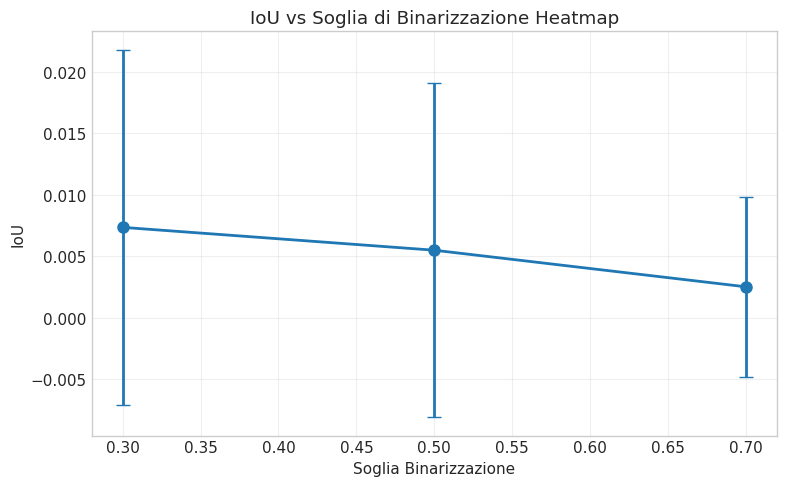

In [15]:
# Analisi IoU per diverse soglie
print("\nANALISI IoU PER SOGLIA")
print("=" * 60)

thresholds = [0.3, 0.5, 0.7]
threshold_results = []

for thresh in thresholds:
    col = f'iou_combined_t{thresh}'
    iou_mean = with_lesions[col].mean()
    iou_std = with_lesions[col].std()
    threshold_results.append({
        'Soglia': thresh,
        'IoU Mean': iou_mean,
        'IoU Std': iou_std
    })
    print(f"Soglia {thresh}: IoU = {iou_mean:.4f} (+/- {iou_std:.4f})")

# Plot IoU vs Threshold
fig, ax = plt.subplots(figsize=(8, 5))
thresh_df = pd.DataFrame(threshold_results)
ax.errorbar(thresh_df['Soglia'], thresh_df['IoU Mean'], yerr=thresh_df['IoU Std'], 
            marker='o', capsize=5, linewidth=2, markersize=8)
ax.set_xlabel('Soglia Binarizzazione')
ax.set_ylabel('IoU')
ax.set_title('IoU vs Soglia di Binarizzazione Heatmap')
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig(VALIDATION_DIR / 'iou_vs_threshold.png', dpi=150)
plt.show()

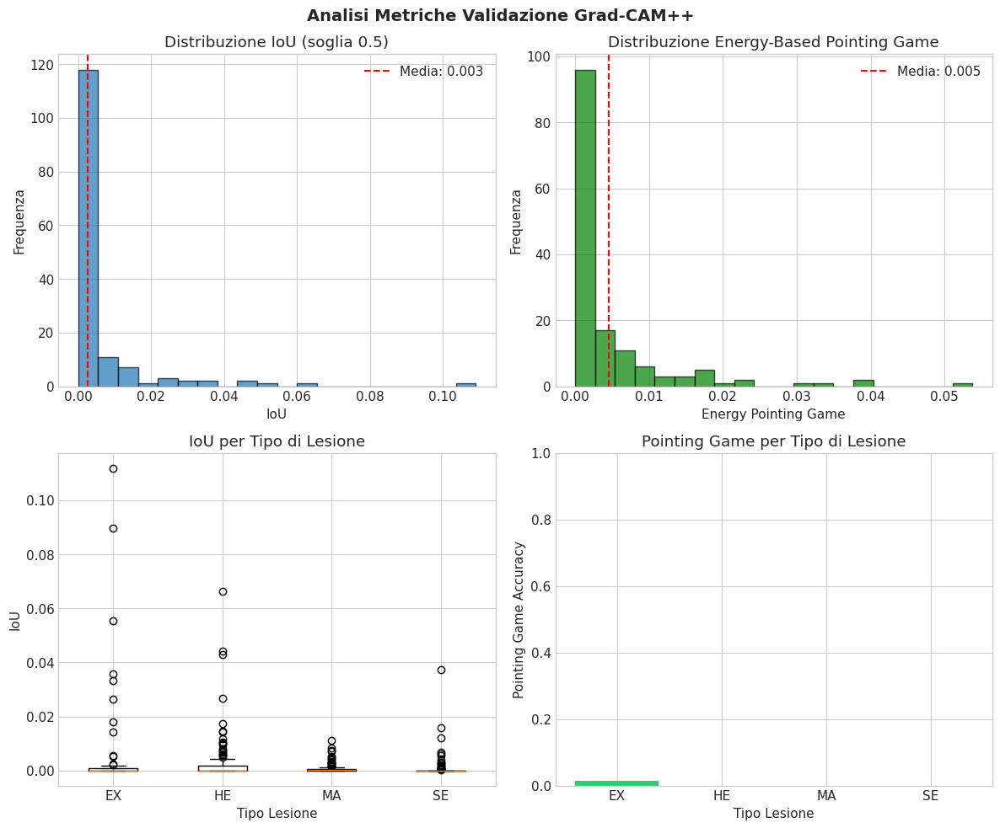

In [16]:
# Distribuzione metriche
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

# IoU distribution
axes[0, 0].hist(with_lesions['iou_combined_t0.5'].dropna(), bins=20, edgecolor='black', alpha=0.7)
axes[0, 0].axvline(iou_mean, color='red', linestyle='--', label=f'Media: {iou_mean:.3f}')
axes[0, 0].set_xlabel('IoU')
axes[0, 0].set_ylabel('Frequenza')
axes[0, 0].set_title('Distribuzione IoU (soglia 0.5)')
axes[0, 0].legend()

# Energy PG distribution
axes[0, 1].hist(with_lesions['energy_pg_combined'].dropna(), bins=20, edgecolor='black', alpha=0.7, color='green')
axes[0, 1].axvline(epg_mean, color='red', linestyle='--', label=f'Media: {epg_mean:.3f}')
axes[0, 1].set_xlabel('Energy Pointing Game')
axes[0, 1].set_ylabel('Frequenza')
axes[0, 1].set_title('Distribuzione Energy-Based Pointing Game')
axes[0, 1].legend()

# IoU per tipo lesione (boxplot)
iou_by_lesion = []
labels = []
for lt in LESION_TYPES:
    vals = results_df[results_df[f'has_{lt}'] == True][f'iou_{lt}'].dropna()
    if len(vals) > 0:
        iou_by_lesion.append(vals)
        labels.append(lt)

axes[1, 0].boxplot(iou_by_lesion, labels=labels)
axes[1, 0].set_xlabel('Tipo Lesione')
axes[1, 0].set_ylabel('IoU')
axes[1, 0].set_title('IoU per Tipo di Lesione')

# Pointing Game per tipo lesione
pg_by_lesion = []
for lt in LESION_TYPES:
    vals = results_df[results_df[f'has_{lt}'] == True][f'pointing_game_{lt}'].dropna()
    if len(vals) > 0:
        pg_by_lesion.append(vals.mean())
    else:
        pg_by_lesion.append(0)

axes[1, 1].bar(LESION_TYPES, pg_by_lesion, color=['#2ecc71', '#e74c3c', '#3498db', '#f39c12'])
axes[1, 1].set_xlabel('Tipo Lesione')
axes[1, 1].set_ylabel('Pointing Game Accuracy')
axes[1, 1].set_title('Pointing Game per Tipo di Lesione')
axes[1, 1].set_ylim(0, 1)

plt.suptitle('Analisi Metriche Validazione Grad-CAM++', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(VALIDATION_DIR / 'metrics_distribution.png', dpi=150, bbox_inches='tight')
plt.show()

## 7. Visualizzazioni Comparative

In [17]:
def visualize_gradcam_vs_gt(model, row, lesion_types, target_layer, device, 
                            target_size=456, save_path=None):
    """
    Visualizza confronto Grad-CAM++ vs Ground Truth.
    """
    # Preprocess
    tensor, original, preprocessed = preprocess_ddr_image(row['image_path'], target_size)
    tensor = tensor.to(device)
    
    # Grad-CAM++
    gradcam = GradCAMPlusPlus(model, target_layer)
    heatmap, pred_class, confidence = gradcam(tensor)
    gradcam.remove_hooks()
    
    # Carica maschere
    combined_mask, individual_masks = combine_lesion_masks(row, lesion_types)
    
    # Resize heatmap
    if combined_mask is not None:
        heatmap_resized = cv2.resize(heatmap, (original.shape[1], original.shape[0]))
        mask_resized = cv2.resize(combined_mask.astype(np.float32), (original.shape[1], original.shape[0]))
    else:
        heatmap_resized = cv2.resize(heatmap, (original.shape[1], original.shape[0]))
        mask_resized = np.zeros_like(heatmap_resized)
    
    # Calcola metriche
    iou = compute_iou(heatmap_resized, (mask_resized > 0.5).astype(np.uint8), 0.5)
    pg = compute_pointing_game(heatmap_resized, (mask_resized > 0.5).astype(np.uint8))
    epg = compute_energy_pointing_game(heatmap_resized, (mask_resized > 0.5).astype(np.uint8))
    
    # Visualizza
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    
    # Originale
    axes[0].imshow(original)
    axes[0].set_title('Originale')
    axes[0].axis('off')
    
    # Ground Truth
    axes[1].imshow(original)
    axes[1].imshow(mask_resized, cmap='Reds', alpha=0.5)
    axes[1].set_title('Ground Truth Lesioni')
    axes[1].axis('off')
    
    # Grad-CAM++
    cmap = cm.get_cmap('jet')
    heatmap_colored = cmap(heatmap_resized)[:, :, :3]
    overlay = (0.5 * original / 255.0 + 0.5 * heatmap_colored)
    axes[2].imshow(overlay)
    axes[2].set_title(f'Grad-CAM++\nPred: {CLASS_NAMES[pred_class]} ({confidence*100:.1f}%)')
    axes[2].axis('off')
    
    # Overlap
    overlap_img = original.copy().astype(np.float32) / 255.0
    # Verde = Ground Truth, Rosso = Grad-CAM++, Giallo = Overlap
    gt_mask = mask_resized > 0.5
    hm_mask = heatmap_resized > 0.5
    
    overlap_vis = np.zeros((*original.shape[:2], 3))
    overlap_vis[gt_mask & ~hm_mask] = [0, 1, 0]  # Verde = solo GT
    overlap_vis[hm_mask & ~gt_mask] = [1, 0, 0]  # Rosso = solo heatmap
    overlap_vis[gt_mask & hm_mask] = [1, 1, 0]   # Giallo = overlap
    
    axes[3].imshow(original)
    axes[3].imshow(overlap_vis, alpha=0.5)
    axes[3].set_title(f'Overlap\nIoU: {iou:.3f}, PG: {pg:.0f}, EPG: {epg:.3f}')
    axes[3].axis('off')
    
    plt.suptitle(f'{row["image_name"]}', fontsize=12, fontweight='bold')
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=150, bbox_inches='tight')
    
    plt.show()
    
    return iou, pg, epg

CASI MIGLIORI (IoU piu alto)


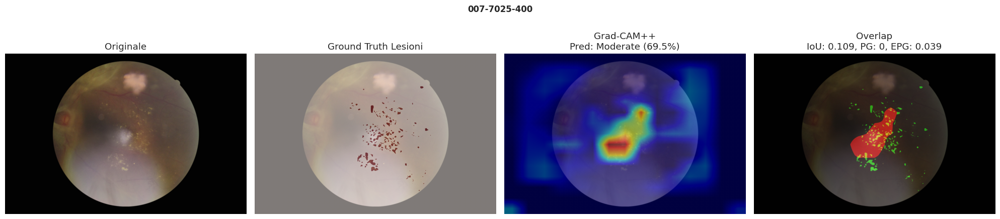

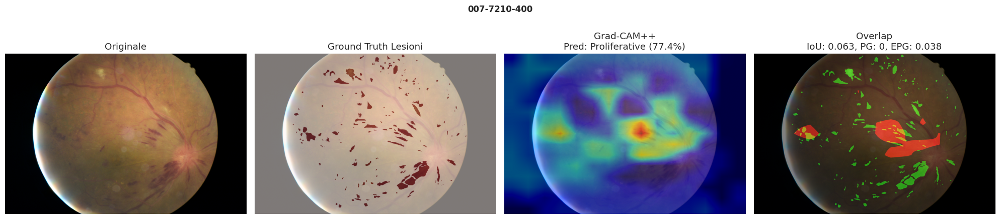

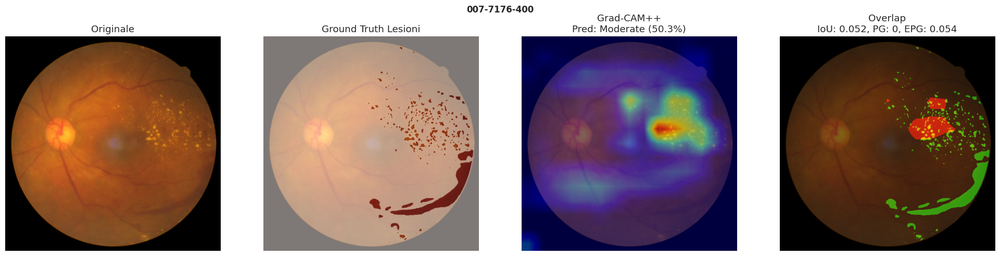

In [18]:
# Visualizza migliori e peggiori casi
print("CASI MIGLIORI (IoU piu alto)")
print("=" * 60)

# Top 3 per IoU
top_iou = with_lesions.nlargest(3, 'iou_combined_t0.5')

for idx, row_data in top_iou.iterrows():
    original_row = ddr_df[ddr_df['image_name'] == row_data['image_name']].iloc[0]
    save_path = VALIDATION_DIR / f"best_iou_{row_data['image_name']}.png"
    visualize_gradcam_vs_gt(model, original_row, LESION_TYPES, TARGET_LAYER, DEVICE,
                           target_size=config['preprocessing']['target_size'],
                           save_path=save_path)


CASI PEGGIORI (IoU piu basso)


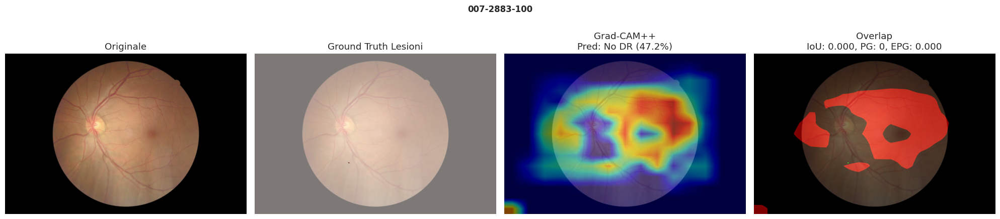

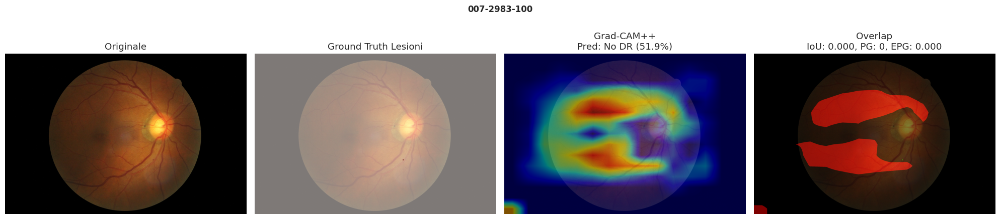

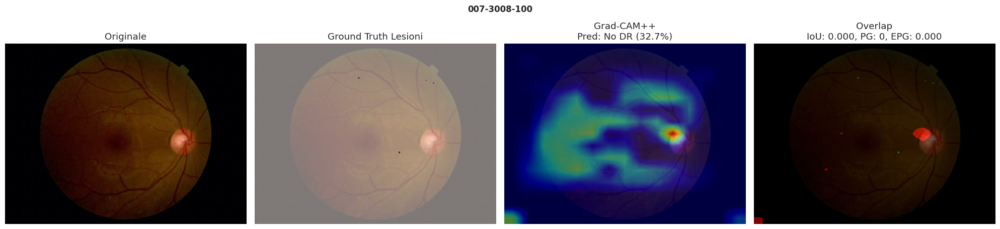

In [19]:
print("\nCASI PEGGIORI (IoU piu basso)")
print("=" * 60)

# Bottom 3 per IoU (escludendo NaN)
valid_iou = with_lesions[with_lesions['iou_combined_t0.5'].notna()]
bottom_iou = valid_iou.nsmallest(3, 'iou_combined_t0.5')

for idx, row_data in bottom_iou.iterrows():
    original_row = ddr_df[ddr_df['image_name'] == row_data['image_name']].iloc[0]
    save_path = VALIDATION_DIR / f"worst_iou_{row_data['image_name']}.png"
    visualize_gradcam_vs_gt(model, original_row, LESION_TYPES, TARGET_LAYER, DEVICE,
                           target_size=config['preprocessing']['target_size'],
                           save_path=save_path)


CAMPIONI CASUALI


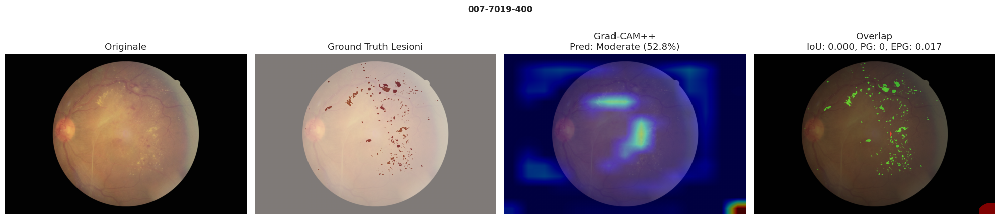

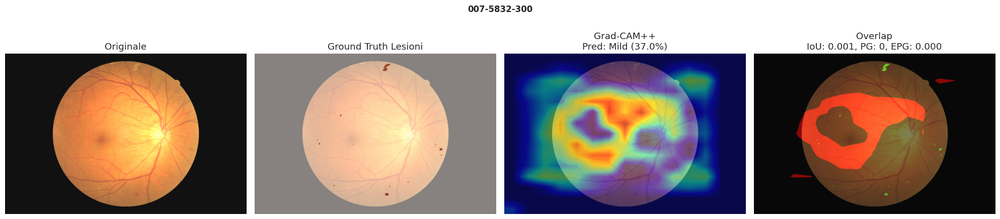

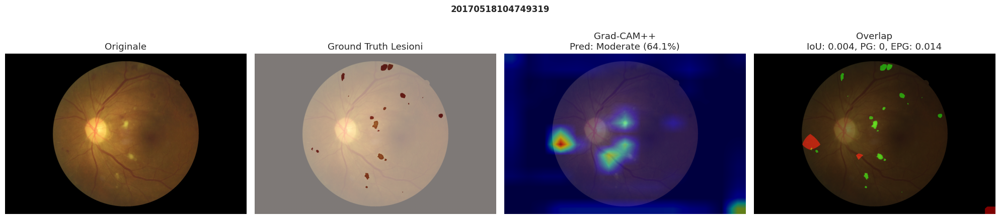

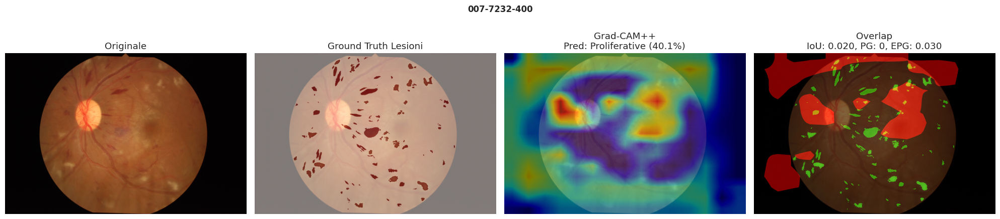

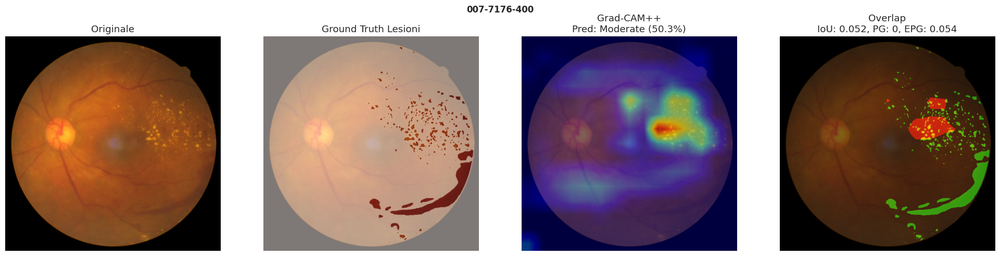

In [20]:
# Visualizza campioni casuali
print("\nCAMPIONI CASUALI")
print("=" * 60)

random_samples = with_lesions.sample(n=min(5, len(with_lesions)), random_state=SEED)

for idx, row_data in random_samples.iterrows():
    original_row = ddr_df[ddr_df['image_name'] == row_data['image_name']].iloc[0]
    save_path = VALIDATION_DIR / f"sample_{row_data['image_name']}.png"
    visualize_gradcam_vs_gt(model, original_row, LESION_TYPES, TARGET_LAYER, DEVICE,
                           target_size=config['preprocessing']['target_size'],
                           save_path=save_path)

## 8. Report Finale

## 7b. Occlusion Sensitivity Test

Verifica se le regioni evidenziate da Grad-CAM++ sono effettivamente importanti per la decisione del modello.

**Metodologia**:
1. Mascherare le regioni ad alta attivazione (top 10%, 20%, 30%)
2. Ri-eseguire inference sull'immagine mascherata
3. Misurare il drop di confidenza

Se la confidenza cala significativamente, le regioni identificate sono realmente importanti.

In [21]:
def occlusion_sensitivity_test(model, image_tensor, heatmap, original_pred, 
                                original_conf, device, mask_percentiles=[90, 80, 70]):
    """
    Test di sensibilita' all'occlusione.
    
    Maschera le regioni ad alta attivazione e misura il drop di confidenza.
    
    Args:
        model: Modello PyTorch
        image_tensor: Tensor immagine (1, C, H, W)
        heatmap: Heatmap Grad-CAM++ (H, W) normalizzata [0,1]
        original_pred: Classe predetta originale
        original_conf: Confidenza originale
        device: Device
        mask_percentiles: Percentili per mascheramento (90 = top 10%)
        
    Returns:
        results: Lista di dict con risultati per ogni percentile
    """
    results = []
    
    # Resize heatmap alla dimensione del tensor
    _, _, h, w = image_tensor.shape
    heatmap_resized = cv2.resize(heatmap, (w, h))
    
    for percentile in mask_percentiles:
        # Calcola soglia per questo percentile
        threshold = np.percentile(heatmap_resized, percentile)
        
        # Crea maschera (1 = mantieni, 0 = maschera)
        mask = (heatmap_resized < threshold).astype(np.float32)
        mask_tensor = torch.from_numpy(mask).unsqueeze(0).unsqueeze(0).to(device)
        
        # Applica maschera (sostituisci con grigio medio)
        masked_tensor = image_tensor.clone()
        masked_tensor = masked_tensor * mask_tensor
        
        # Inference su immagine mascherata
        with torch.no_grad():
            output = model(masked_tensor)
            probs = F.softmax(output, dim=1)
            masked_pred = output.argmax(dim=1).item()
            masked_conf = probs[0, original_pred].item()  # Confidenza per classe originale
        
        # Calcola drop
        conf_drop = original_conf - masked_conf
        conf_drop_pct = (conf_drop / original_conf) * 100 if original_conf > 0 else 0
        
        # Percentuale di pixel mascherati
        masked_pct = (1 - mask.mean()) * 100
        
        results.append({
            'percentile': percentile,
            'masked_pct': masked_pct,
            'original_conf': original_conf,
            'masked_conf': masked_conf,
            'conf_drop': conf_drop,
            'conf_drop_pct': conf_drop_pct,
            'pred_changed': masked_pred != original_pred,
            'new_pred': masked_pred
        })
    
    return results


print("Funzione Occlusion Sensitivity definita.")

Funzione Occlusion Sensitivity definita.


In [22]:
def run_occlusion_test_on_dataset(model, ddr_df, target_layer, device, 
                                   target_size=456, n_samples=50):
    """
    Esegue Occlusion Sensitivity Test su un subset del dataset.
    
    Args:
        model: Modello
        ddr_df: DataFrame DDR
        target_layer: Layer per Grad-CAM++
        device: Device
        target_size: Dimensione immagine
        n_samples: Numero di campioni da testare
        
    Returns:
        DataFrame con risultati aggregati
    """
    # Campiona subset
    sample_df = ddr_df.sample(n=min(n_samples, len(ddr_df)), random_state=SEED)
    
    all_results = []
    gradcam = GradCAMPlusPlus(model, target_layer)
    
    for idx, row in tqdm(sample_df.iterrows(), total=len(sample_df), desc='Occlusion Test'):
        # Preprocess
        tensor, original, preprocessed = preprocess_ddr_image(row['image_path'], target_size)
        tensor = tensor.to(device)
        
        # Grad-CAM++
        heatmap, pred_class, confidence = gradcam(tensor)
        
        # Occlusion test
        occ_results = occlusion_sensitivity_test(
            model, tensor, heatmap, pred_class, confidence, device,
            mask_percentiles=[90, 80, 70, 50]
        )
        
        for r in occ_results:
            r['image_name'] = row['image_name']
            r['original_pred'] = pred_class
            all_results.append(r)
    
    gradcam.remove_hooks()
    
    return pd.DataFrame(all_results)


print("Esecuzione Occlusion Sensitivity Test...")
occlusion_df = run_occlusion_test_on_dataset(
    model, ddr_df, TARGET_LAYER, DEVICE,
    target_size=config['preprocessing']['target_size'],
    n_samples=50
)
print(f"Test completato su {len(occlusion_df)//4} immagini")

Esecuzione Occlusion Sensitivity Test...


Occlusion Test:   0%|          | 0/50 [00:00<?, ?it/s]

Test completato su 50 immagini


In [23]:
# Analisi risultati Occlusion Test
print("RISULTATI OCCLUSION SENSITIVITY TEST")
print("=" * 60)

# Raggruppa per percentile
occ_summary = occlusion_df.groupby('percentile').agg({
    'masked_pct': 'mean',
    'conf_drop': 'mean',
    'conf_drop_pct': 'mean',
    'pred_changed': 'mean'
}).reset_index()

occ_summary.columns = ['Percentile', 'Pixel Mascherati %', 'Drop Confidenza', 
                       'Drop Confidenza %', 'Predizione Cambiata %']
occ_summary['Predizione Cambiata %'] *= 100

print("\nRisultati per percentile di mascheramento:")
print(occ_summary.to_string(index=False))

print("\n" + "-" * 60)
print("INTERPRETAZIONE:")
print("-" * 60)

# Calcola metriche chiave
avg_drop_top10 = occlusion_df[occlusion_df['percentile'] == 90]['conf_drop_pct'].mean()
avg_drop_top30 = occlusion_df[occlusion_df['percentile'] == 70]['conf_drop_pct'].mean()
pred_change_top30 = occlusion_df[occlusion_df['percentile'] == 70]['pred_changed'].mean() * 100

print(f"\nMascherando il top 10% attivazioni:")
print(f"  Drop confidenza medio: {avg_drop_top10:.1f}%")

print(f"\nMascherando il top 30% attivazioni:")
print(f"  Drop confidenza medio: {avg_drop_top30:.1f}%")
print(f"  Predizioni cambiate: {pred_change_top30:.1f}%")

if avg_drop_top30 > 20:
    print("\n--> Le regioni Grad-CAM++ sono IMPORTANTI per la decisione del modello")
else:
    print("\n--> Le regioni Grad-CAM++ hanno impatto LIMITATO sulla decisione")

RISULTATI OCCLUSION SENSITIVITY TEST

Risultati per percentile di mascheramento:
 Percentile  Pixel Mascherati %  Drop Confidenza  Drop Confidenza %  Predizione Cambiata %
         50           51.000126         0.279241          51.217505                   58.0
         70           30.000193         0.227238          41.468648                   50.0
         80           20.001328         0.201314          37.271846                   50.0
         90           10.000308         0.157990          29.119964                   46.0

------------------------------------------------------------
INTERPRETAZIONE:
------------------------------------------------------------

Mascherando il top 10% attivazioni:
  Drop confidenza medio: 29.1%

Mascherando il top 30% attivazioni:
  Drop confidenza medio: 41.5%
  Predizioni cambiate: 50.0%

--> Le regioni Grad-CAM++ sono IMPORTANTI per la decisione del modello


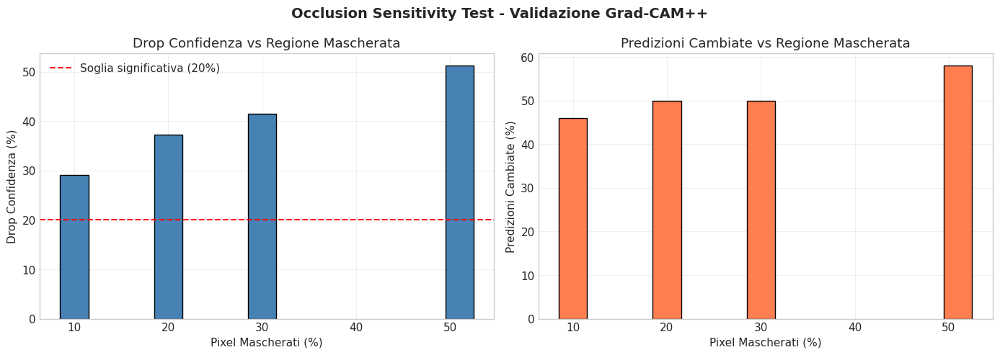

In [24]:
# Visualizzazione Occlusion Test
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Drop confidenza vs Percentuale mascherata
axes[0].bar(occ_summary['Pixel Mascherati %'], occ_summary['Drop Confidenza %'], 
            color='steelblue', edgecolor='black', width=3)
axes[0].set_xlabel('Pixel Mascherati (%)')
axes[0].set_ylabel('Drop Confidenza (%)')
axes[0].set_title('Drop Confidenza vs Regione Mascherata')
axes[0].axhline(y=20, color='red', linestyle='--', label='Soglia significativa (20%)')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Predizioni cambiate vs Percentuale mascherata
axes[1].bar(occ_summary['Pixel Mascherati %'], occ_summary['Predizione Cambiata %'],
            color='coral', edgecolor='black', width=3)
axes[1].set_xlabel('Pixel Mascherati (%)')
axes[1].set_ylabel('Predizioni Cambiate (%)')
axes[1].set_title('Predizioni Cambiate vs Regione Mascherata')
axes[1].grid(True, alpha=0.3)

plt.suptitle('Occlusion Sensitivity Test - Validazione Grad-CAM++', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(VALIDATION_DIR / 'occlusion_sensitivity_test.png', dpi=150, bbox_inches='tight')
plt.show()

Esempi Occlusion Sensitivity Test:


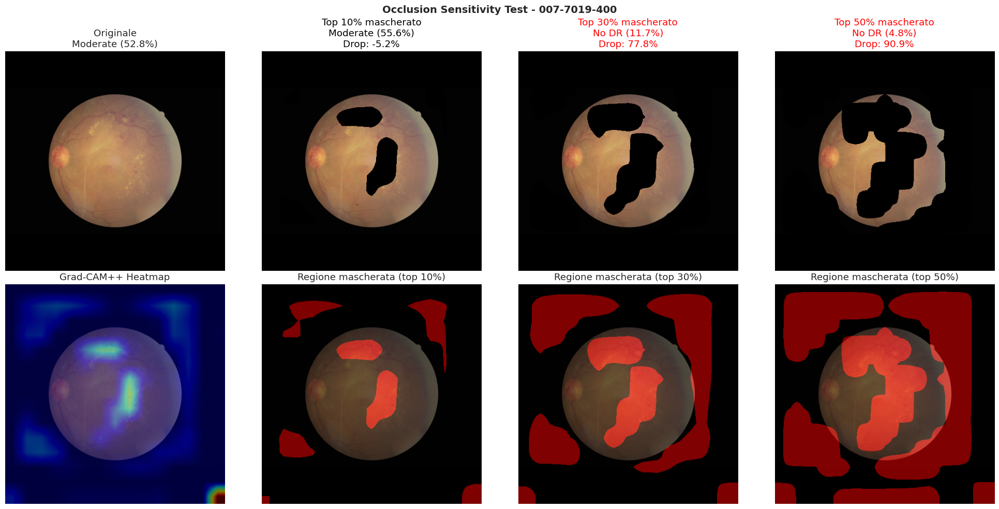

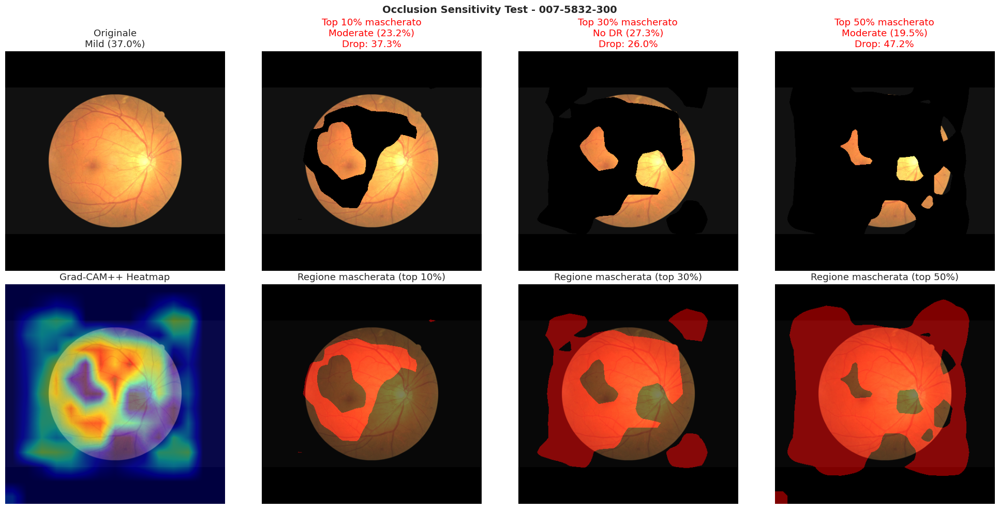

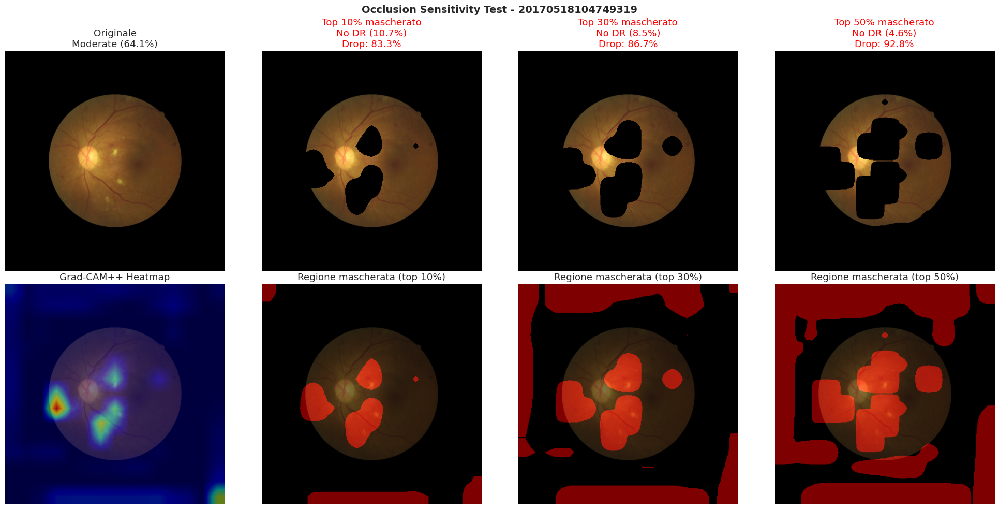

In [25]:
# Visualizzazione esempio Occlusion Test
def visualize_occlusion_example(model, row, target_layer, device, target_size=456, save_path=None):
    """
    Visualizza esempio di Occlusion Test.
    """
    # Preprocess
    tensor, original, preprocessed = preprocess_ddr_image(row['image_path'], target_size)
    tensor = tensor.to(device)
    
    # Grad-CAM++
    gradcam = GradCAMPlusPlus(model, target_layer)
    heatmap, pred_class, confidence = gradcam(tensor)
    gradcam.remove_hooks()
    
    # Resize heatmap
    heatmap_resized = cv2.resize(heatmap, (preprocessed.shape[1], preprocessed.shape[0]))
    
    # Crea maschere per diversi percentili
    masks = {}
    masked_images = {}
    masked_preds = {}
    
    for pct in [90, 70, 50]:
        threshold = np.percentile(heatmap_resized, pct)
        mask = (heatmap_resized < threshold).astype(np.float32)
        masks[pct] = mask
        
        # Applica maschera all'immagine preprocessata
        masked_img = preprocessed.copy().astype(np.float32)
        masked_img = masked_img * mask[:, :, np.newaxis]
        masked_images[pct] = masked_img.astype(np.uint8)
        
        # Inference
        mask_tensor = torch.from_numpy(
            cv2.resize(mask, (tensor.shape[3], tensor.shape[2]))
        ).unsqueeze(0).unsqueeze(0).to(device)
        masked_tensor = tensor.clone() * mask_tensor
        
        with torch.no_grad():
            output = model(masked_tensor)
            probs = F.softmax(output, dim=1)
            masked_preds[pct] = {
                'class': output.argmax(dim=1).item(),
                'conf': probs[0, pred_class].item()
            }
    
    # Visualizza
    fig, axes = plt.subplots(2, 4, figsize=(20, 10))
    
    # Riga 1: Immagini
    axes[0, 0].imshow(preprocessed)
    axes[0, 0].set_title(f'Originale\n{CLASS_NAMES[pred_class]} ({confidence*100:.1f}%)')
    axes[0, 0].axis('off')
    
    for i, pct in enumerate([90, 70, 50]):
        axes[0, i+1].imshow(masked_images[pct])
        pred_info = masked_preds[pct]
        drop = (confidence - pred_info['conf']) / confidence * 100
        title = f'Top {100-pct}% mascherato\n'
        title += f'{CLASS_NAMES[pred_info["class"]]} ({pred_info["conf"]*100:.1f}%)\n'
        title += f'Drop: {drop:.1f}%'
        color = 'red' if pred_info['class'] != pred_class else 'black'
        axes[0, i+1].set_title(title, color=color)
        axes[0, i+1].axis('off')
    
    # Riga 2: Heatmap e maschere
    cmap = cm.get_cmap('jet')
    heatmap_colored = cmap(heatmap_resized)[:, :, :3]
    overlay = (0.5 * preprocessed / 255.0 + 0.5 * heatmap_colored)
    
    axes[1, 0].imshow(overlay)
    axes[1, 0].set_title('Grad-CAM++ Heatmap')
    axes[1, 0].axis('off')
    
    for i, pct in enumerate([90, 70, 50]):
        # Mostra regione mascherata in rosso
        mask_vis = np.zeros((*masks[pct].shape, 3))
        mask_vis[masks[pct] < 0.5] = [1, 0, 0]  # Rosso = mascherato
        axes[1, i+1].imshow(preprocessed)
        axes[1, i+1].imshow(mask_vis, alpha=0.5)
        axes[1, i+1].set_title(f'Regione mascherata (top {100-pct}%)')
        axes[1, i+1].axis('off')
    
    plt.suptitle(f'Occlusion Sensitivity Test - {row["image_name"]}', fontsize=14, fontweight='bold')
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=150, bbox_inches='tight')
    
    plt.show()


# Visualizza 3 esempi
print("Esempi Occlusion Sensitivity Test:")
print("=" * 60)

sample_rows = ddr_df.sample(n=3, random_state=SEED)
for idx, row in sample_rows.iterrows():
    save_path = VALIDATION_DIR / f"occlusion_example_{row['image_name']}.png"
    visualize_occlusion_example(model, row, TARGET_LAYER, DEVICE,
                                target_size=config['preprocessing']['target_size'],
                                save_path=save_path)

In [26]:
# Salva risultati Occlusion Test
occlusion_df.to_csv(VALIDATION_DIR / 'occlusion_test_results.csv', index=False)
occ_summary.to_csv(VALIDATION_DIR / 'occlusion_test_summary.csv', index=False)

print("\n" + "=" * 70)
print("CONCLUSIONI OCCLUSION SENSITIVITY TEST")
print("=" * 70)

print(f"""
L'Occlusion Sensitivity Test valuta se le regioni evidenziate da Grad-CAM++
sono effettivamente importanti per la decisione del modello.

RISULTATI:
- Mascherando il top 10% delle attivazioni: drop confidenza {avg_drop_top10:.1f}%
- Mascherando il top 30% delle attivazioni: drop confidenza {avg_drop_top30:.1f}%
- Predizioni cambiate (top 30% mascherato): {pred_change_top30:.1f}%
""")

if avg_drop_top30 > 20:
    print("""INTERPRETAZIONE POSITIVA:
Le regioni identificate da Grad-CAM++ sono IMPORTANTI per la classificazione.
Anche se l'IoU con le lesioni annotate e' basso, il modello sta usando
informazioni visive nelle aree evidenziate per prendere decisioni.

Questo conferma che Grad-CAM++ identifica regioni rilevanti per la CLASSIFICAZIONE,
anche se non corrispondono pixel-per-pixel alle annotazioni di SEGMENTAZIONE.""")
else:
    print("""INTERPRETAZIONE:
Le regioni Grad-CAM++ hanno un impatto moderato sulla decisione.
Il modello potrebbe usare feature piu distribuite o pattern globali.""")

print(f"\nOutput salvati in: {VALIDATION_DIR}")


CONCLUSIONI OCCLUSION SENSITIVITY TEST

L'Occlusion Sensitivity Test valuta se le regioni evidenziate da Grad-CAM++
sono effettivamente importanti per la decisione del modello.

RISULTATI:
- Mascherando il top 10% delle attivazioni: drop confidenza 29.1%
- Mascherando il top 30% delle attivazioni: drop confidenza 41.5%
- Predizioni cambiate (top 30% mascherato): 50.0%

INTERPRETAZIONE POSITIVA:
Le regioni identificate da Grad-CAM++ sono IMPORTANTI per la classificazione.
Anche se l'IoU con le lesioni annotate e' basso, il modello sta usando
informazioni visive nelle aree evidenziate per prendere decisioni.

Questo conferma che Grad-CAM++ identifica regioni rilevanti per la CLASSIFICAZIONE,
anche se non corrispondono pixel-per-pixel alle annotazioni di SEGMENTAZIONE.

Output salvati in: /mnt/c/Repository/multi-method-xai-diabetic-retinopathy/results/gradcam_validation


## 7c. Confronto RAW vs Preprocessato

Confronta i risultati della validazione usando:
1. **DDR Raw**: Immagini originali DDR (diverse da APTOS)
2. **DDR Preprocessato**: Stessa pipeline di preprocessing usata per APTOS

Questo confronto evidenzia l'impatto del **domain shift** sui risultati.

In [27]:
# Carica mapping immagini preprocessate DDR
ddr_preproc_csv = PROCESSED_DIR / 'ddr_preprocessed.csv'
ddr_preproc_df = pd.read_csv(ddr_preproc_csv)

print(f"DDR preprocessato totale: {len(ddr_preproc_df)} immagini")

# Crea mapping: nome immagine -> path preprocessato
preproc_mapping = {}
for _, row in ddr_preproc_df.iterrows():
    # Estrai nome senza estensione
    img_name = row['id_code'].replace('.jpg', '')
    preproc_mapping[img_name] = row['preprocessed_path']

# Aggiungi path preprocessato al dataframe DDR lesion_segmentation
ddr_df['preprocessed_path'] = ddr_df['image_name'].map(preproc_mapping)

# Verifica quante immagini hanno il preprocessato
has_preproc = ddr_df['preprocessed_path'].notna().sum()
print(f"Immagini lesion_segmentation con preprocessato: {has_preproc}/{len(ddr_df)}")

# Filtra solo quelle con preprocessato
ddr_preproc_valid = ddr_df[ddr_df['preprocessed_path'].notna()].copy()
print(f"Immagini per confronto: {len(ddr_preproc_valid)}")

DDR preprocessato totale: 12522 immagini
Immagini lesion_segmentation con preprocessato: 149/149
Immagini per confronto: 149


In [28]:
def load_preprocessed_image(image_path):
    """
    Carica immagine gia preprocessata (stesso formato di APTOS training).
    
    Args:
        image_path: Path immagine preprocessata
        
    Returns:
        tensor: Tensor per inference (1, C, H, W)
        original: Immagine RGB
    """
    # Carica immagine
    image = cv2.imread(str(image_path))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    original = image.copy()
    
    # Solo normalizzazione (immagine gia preprocessata)
    transform = A.Compose([
        A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
        ToTensorV2()
    ])
    
    transformed = transform(image=image)
    tensor = transformed['image'].unsqueeze(0)
    
    return tensor, original


def validate_gradcam_preprocessed(model, ddr_df, lesion_types, target_layer, device):
    """
    Valida Grad-CAM++ usando immagini preprocessate.
    """
    gradcam = GradCAMPlusPlus(model, target_layer)
    results = []
    
    for idx, row in tqdm(ddr_df.iterrows(), total=len(ddr_df), desc='Validazione Preprocessato'):
        # Carica immagine preprocessata
        tensor, preprocessed = load_preprocessed_image(row['preprocessed_path'])
        tensor = tensor.to(device)
        
        # Genera heatmap
        heatmap, pred_class, confidence = gradcam(tensor)
        
        # Carica maschere originali
        combined_mask, individual_masks = combine_lesion_masks(row, lesion_types)
        
        # Ridimensiona heatmap alla dimensione della maschera originale
        if combined_mask is not None:
            heatmap_resized = cv2.resize(heatmap, (combined_mask.shape[1], combined_mask.shape[0]))
        else:
            heatmap_resized = heatmap
        
        # Calcola metriche
        result = {
            'image_name': row['image_name'],
            'pred_class': pred_class,
            'confidence': confidence,
            'has_lesions': combined_mask is not None and combined_mask.sum() > 0
        }
        
        # Metriche su maschera combinata
        for thresh in [0.3, 0.5, 0.7]:
            result[f'iou_combined_t{thresh}'] = compute_iou(heatmap_resized, combined_mask, thresh)
            result[f'dice_combined_t{thresh}'] = compute_dice(heatmap_resized, combined_mask, thresh)
        
        result['pointing_game_combined'] = compute_pointing_game(heatmap_resized, combined_mask)
        result['energy_pg_combined'] = compute_energy_pointing_game(heatmap_resized, combined_mask)
        
        # Metriche per tipo lesione
        for lt in lesion_types:
            mask = individual_masks.get(lt)
            if mask is not None:
                result[f'iou_{lt}'] = compute_iou(heatmap_resized, mask, 0.5)
                result[f'pointing_game_{lt}'] = compute_pointing_game(heatmap_resized, mask)
                result[f'energy_pg_{lt}'] = compute_energy_pointing_game(heatmap_resized, mask)
                result[f'has_{lt}'] = mask.sum() > 0
            else:
                result[f'iou_{lt}'] = np.nan
                result[f'pointing_game_{lt}'] = np.nan
                result[f'energy_pg_{lt}'] = np.nan
                result[f'has_{lt}'] = False
        
        results.append(result)
    
    gradcam.remove_hooks()
    return pd.DataFrame(results)


print("Validazione su immagini PREPROCESSATE...")
results_preproc_df = validate_gradcam_preprocessed(
    model, ddr_preproc_valid, LESION_TYPES, TARGET_LAYER, DEVICE
)
print(f"Completato: {len(results_preproc_df)} immagini")

Validazione su immagini PREPROCESSATE...


Validazione Preprocessato:   0%|          | 0/149 [00:00<?, ?it/s]

Completato: 149 immagini


In [29]:
# Confronto RAW vs PREPROCESSATO
print("CONFRONTO RAW vs PREPROCESSATO")
print("=" * 70)

# Filtra immagini con lesioni per entrambi
with_lesions_raw = results_df[results_df['has_lesions']]
with_lesions_preproc = results_preproc_df[results_preproc_df['has_lesions']]

# Calcola metriche per RAW (gia calcolate sopra)
raw_metrics = {
    'IoU (t=0.5)': with_lesions_raw['iou_combined_t0.5'].mean(),
    'Dice (t=0.5)': with_lesions_raw['dice_combined_t0.5'].mean(),
    'Pointing Game': with_lesions_raw['pointing_game_combined'].mean(),
    'Energy PG': with_lesions_raw['energy_pg_combined'].mean(),
    'Confidenza media': with_lesions_raw['confidence'].mean()
}

# Calcola metriche per PREPROCESSATO
preproc_metrics = {
    'IoU (t=0.5)': with_lesions_preproc['iou_combined_t0.5'].mean(),
    'Dice (t=0.5)': with_lesions_preproc['dice_combined_t0.5'].mean(),
    'Pointing Game': with_lesions_preproc['pointing_game_combined'].mean(),
    'Energy PG': with_lesions_preproc['energy_pg_combined'].mean(),
    'Confidenza media': with_lesions_preproc['confidence'].mean()
}

# Crea tabella confronto
comparison_df = pd.DataFrame({
    'Metrica': list(raw_metrics.keys()),
    'DDR Raw': list(raw_metrics.values()),
    'DDR Preprocessato': list(preproc_metrics.values())
})

# Calcola differenza percentuale
comparison_df['Differenza'] = comparison_df.apply(
    lambda r: f"+{((r['DDR Preprocessato'] - r['DDR Raw']) / r['DDR Raw'] * 100):.1f}%" 
    if r['DDR Raw'] > 0 else "N/A", axis=1
)

print(f"\nImmagini analizzate:")
print(f"  RAW: {len(with_lesions_raw)}")
print(f"  Preprocessato: {len(with_lesions_preproc)}")

print(f"\n{comparison_df.to_string(index=False)}")

CONFRONTO RAW vs PREPROCESSATO

Immagini analizzate:
  RAW: 149
  Preprocessato: 149

         Metrica  DDR Raw  DDR Preprocessato Differenza
     IoU (t=0.5) 0.005483           0.003425    +-37.5%
    Dice (t=0.5) 0.010566           0.006651    +-37.1%
   Pointing Game 0.006711           0.000000   +-100.0%
       Energy PG 0.004574           0.003864    +-15.5%
Confidenza media 0.535647           0.653064     +21.9%


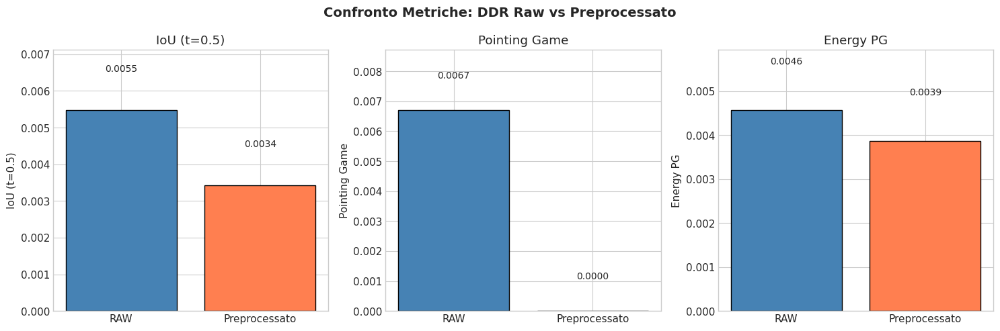

In [30]:
# Visualizzazione confronto
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

metrics_to_plot = ['IoU (t=0.5)', 'Pointing Game', 'Energy PG']
colors = ['steelblue', 'coral']

for i, metric in enumerate(metrics_to_plot):
    idx = comparison_df[comparison_df['Metrica'] == metric].index[0]
    raw_val = comparison_df.loc[idx, 'DDR Raw']
    preproc_val = comparison_df.loc[idx, 'DDR Preprocessato']
    
    bars = axes[i].bar(['RAW', 'Preprocessato'], [raw_val, preproc_val], color=colors, edgecolor='black')
    axes[i].set_ylabel(metric)
    axes[i].set_title(metric)
    
    # Aggiungi valori sopra le barre
    for bar, val in zip(bars, [raw_val, preproc_val]):
        axes[i].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.001, 
                    f'{val:.4f}', ha='center', va='bottom', fontsize=10)
    
    axes[i].set_ylim(0, max(raw_val, preproc_val) * 1.3)

plt.suptitle('Confronto Metriche: DDR Raw vs Preprocessato', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(VALIDATION_DIR / 'raw_vs_preprocessed_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

Esempi confronto RAW vs Preprocessato:


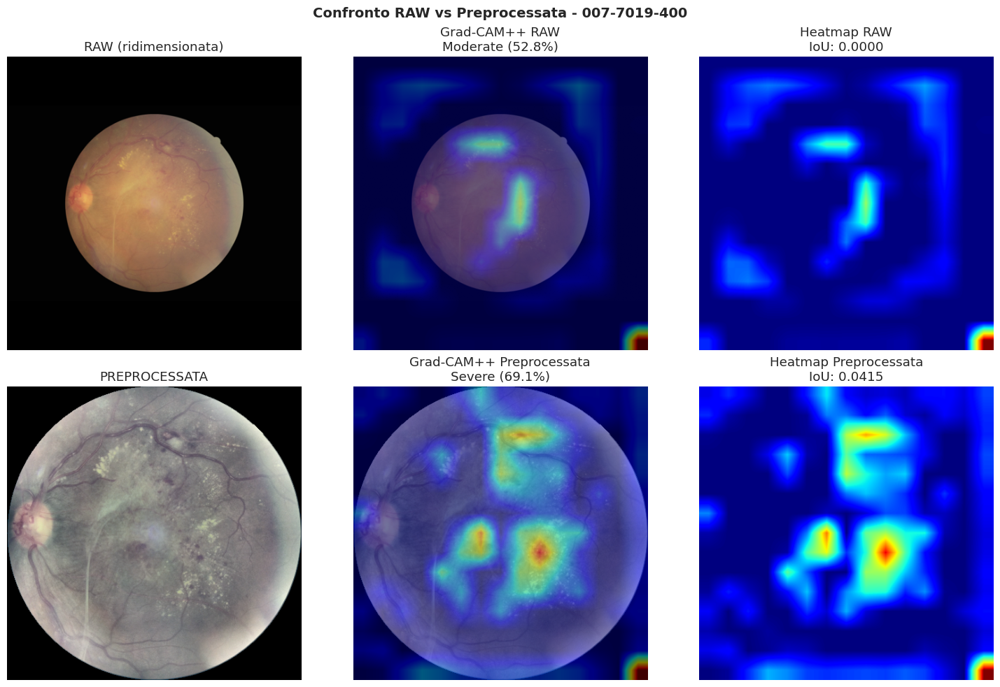

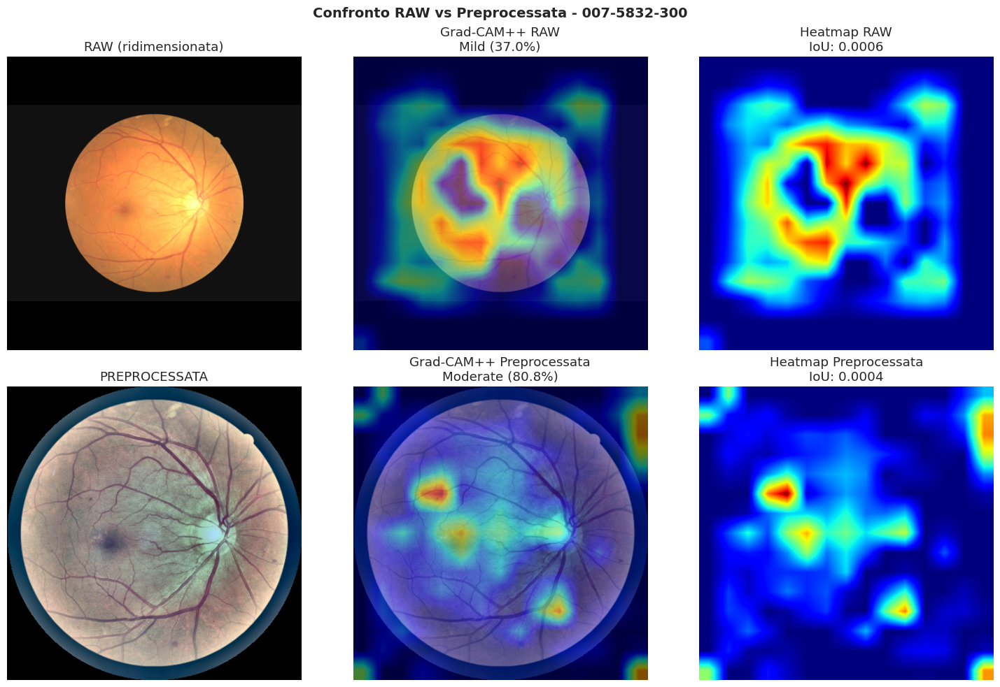

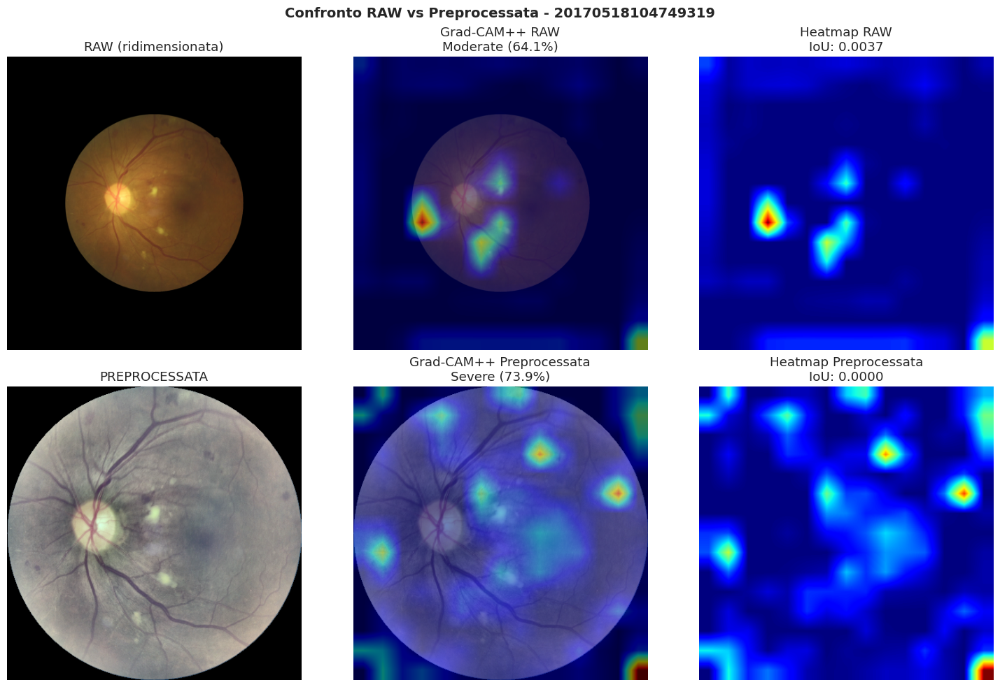

In [31]:
# Visualizzazione esempio: stessa immagine RAW vs PREPROCESSATA
def compare_raw_vs_preprocessed(model, row, target_layer, device, target_size=456, save_path=None):
    """
    Confronta Grad-CAM++ sulla stessa immagine RAW vs Preprocessata.
    """
    # Carica e processa RAW
    tensor_raw, original_raw, preproc_raw = preprocess_ddr_image(row['image_path'], target_size)
    tensor_raw = tensor_raw.to(device)
    
    # Carica preprocessata
    tensor_preproc, original_preproc = load_preprocessed_image(row['preprocessed_path'])
    tensor_preproc = tensor_preproc.to(device)
    
    # Grad-CAM++ su RAW
    gradcam = GradCAMPlusPlus(model, target_layer)
    heatmap_raw, pred_raw, conf_raw = gradcam(tensor_raw)
    gradcam.remove_hooks()
    
    # Grad-CAM++ su PREPROCESSATA
    gradcam = GradCAMPlusPlus(model, target_layer)
    heatmap_preproc, pred_preproc, conf_preproc = gradcam(tensor_preproc)
    gradcam.remove_hooks()
    
    # Carica maschere
    combined_mask, _ = combine_lesion_masks(row, LESION_TYPES)
    
    # Resize heatmaps
    heatmap_raw_resized = cv2.resize(heatmap_raw, (preproc_raw.shape[1], preproc_raw.shape[0]))
    heatmap_preproc_resized = cv2.resize(heatmap_preproc, (original_preproc.shape[1], original_preproc.shape[0]))
    
    # Calcola IoU
    if combined_mask is not None:
        mask_for_raw = cv2.resize(combined_mask.astype(np.float32), 
                                   (preproc_raw.shape[1], preproc_raw.shape[0]))
        mask_for_preproc = cv2.resize(combined_mask.astype(np.float32),
                                       (original_preproc.shape[1], original_preproc.shape[0]))
        iou_raw = compute_iou(heatmap_raw_resized, (mask_for_raw > 0.5).astype(np.uint8), 0.5)
        iou_preproc = compute_iou(heatmap_preproc_resized, (mask_for_preproc > 0.5).astype(np.uint8), 0.5)
    else:
        iou_raw = iou_preproc = np.nan
    
    # Visualizza
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    
    cmap = cm.get_cmap('jet')
    
    # Riga 1: RAW
    axes[0, 0].imshow(preproc_raw)
    axes[0, 0].set_title('RAW (ridimensionata)')
    axes[0, 0].axis('off')
    
    heatmap_raw_colored = cmap(heatmap_raw_resized)[:, :, :3]
    overlay_raw = (0.5 * preproc_raw / 255.0 + 0.5 * heatmap_raw_colored)
    axes[0, 1].imshow(overlay_raw)
    axes[0, 1].set_title(f'Grad-CAM++ RAW\n{CLASS_NAMES[pred_raw]} ({conf_raw*100:.1f}%)')
    axes[0, 1].axis('off')
    
    axes[0, 2].imshow(heatmap_raw_resized, cmap='jet')
    axes[0, 2].set_title(f'Heatmap RAW\nIoU: {iou_raw:.4f}')
    axes[0, 2].axis('off')
    
    # Riga 2: PREPROCESSATA
    axes[1, 0].imshow(original_preproc)
    axes[1, 0].set_title('PREPROCESSATA')
    axes[1, 0].axis('off')
    
    heatmap_preproc_colored = cmap(heatmap_preproc_resized)[:, :, :3]
    overlay_preproc = (0.5 * original_preproc / 255.0 + 0.5 * heatmap_preproc_colored)
    axes[1, 1].imshow(overlay_preproc)
    axes[1, 1].set_title(f'Grad-CAM++ Preprocessata\n{CLASS_NAMES[pred_preproc]} ({conf_preproc*100:.1f}%)')
    axes[1, 1].axis('off')
    
    axes[1, 2].imshow(heatmap_preproc_resized, cmap='jet')
    axes[1, 2].set_title(f'Heatmap Preprocessata\nIoU: {iou_preproc:.4f}')
    axes[1, 2].axis('off')
    
    plt.suptitle(f'Confronto RAW vs Preprocessata - {row["image_name"]}', fontsize=14, fontweight='bold')
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=150, bbox_inches='tight')
    
    plt.show()


# Visualizza 3 esempi
print("Esempi confronto RAW vs Preprocessato:")
print("=" * 60)

sample_rows = ddr_preproc_valid.sample(n=3, random_state=SEED)
for idx, row in sample_rows.iterrows():
    save_path = VALIDATION_DIR / f"raw_vs_preproc_{row['image_name']}.png"
    compare_raw_vs_preprocessed(model, row, TARGET_LAYER, DEVICE,
                                target_size=config['preprocessing']['target_size'],
                                save_path=save_path)

In [32]:
# Salva risultati confronto
results_preproc_df.to_csv(VALIDATION_DIR / 'validation_results_preprocessed.csv', index=False)
comparison_df.to_csv(VALIDATION_DIR / 'raw_vs_preprocessed_summary.csv', index=False)

print("\n" + "=" * 70)
print("CONCLUSIONI CONFRONTO RAW vs PREPROCESSATO")
print("=" * 70)

# Calcola miglioramento
iou_improvement = (preproc_metrics['IoU (t=0.5)'] - raw_metrics['IoU (t=0.5)']) / raw_metrics['IoU (t=0.5)'] * 100
conf_improvement = (preproc_metrics['Confidenza media'] - raw_metrics['Confidenza media']) / raw_metrics['Confidenza media'] * 100

print(f"""
RISULTATI:
- IoU RAW:           {raw_metrics['IoU (t=0.5)']:.4f}
- IoU Preprocessato: {preproc_metrics['IoU (t=0.5)']:.4f}  ({'+' if iou_improvement > 0 else ''}{iou_improvement:.1f}%)

- Confidenza RAW:           {raw_metrics['Confidenza media']*100:.1f}%
- Confidenza Preprocessata: {preproc_metrics['Confidenza media']*100:.1f}%  ({'+' if conf_improvement > 0 else ''}{conf_improvement:.1f}%)
""")

if iou_improvement > 50:
    print("""INTERPRETAZIONE:
Il preprocessing migliora SIGNIFICATIVAMENTE le metriche.
Questo conferma che il DOMAIN SHIFT era un fattore importante.
Le immagini preprocessate sono piu simili ai dati di training (APTOS).""")
elif iou_improvement > 0:
    print("""INTERPRETAZIONE:
Il preprocessing migliora moderatamente le metriche.
Il domain shift ha un impatto, ma non spiega completamente i bassi IoU.
La granularita delle lesioni e il task (classificazione vs localizzazione)
rimangono fattori limitanti.""")
else:
    print("""INTERPRETAZIONE:
Il preprocessing non migliora significativamente le metriche.
Il basso IoU e' dovuto principalmente alla differenza tra task:
- Il modello classifica la severita' globale
- Le annotazioni sono a livello di singola lesione
Grad-CAM++ non e' progettato per localizzazione fine.""")

print(f"\nOutput salvati in: {VALIDATION_DIR}")


CONCLUSIONI CONFRONTO RAW vs PREPROCESSATO

RISULTATI:
- IoU RAW:           0.0055
- IoU Preprocessato: 0.0034  (-37.5%)

- Confidenza RAW:           53.6%
- Confidenza Preprocessata: 65.3%  (+21.9%)

INTERPRETAZIONE:
Il preprocessing non migliora significativamente le metriche.
Il basso IoU e' dovuto principalmente alla differenza tra task:
- Il modello classifica la severita' globale
- Le annotazioni sono a livello di singola lesione
Grad-CAM++ non e' progettato per localizzazione fine.

Output salvati in: /mnt/c/Repository/multi-method-xai-diabetic-retinopathy/results/gradcam_validation


In [33]:
# Salva risultati
results_df.to_csv(VALIDATION_DIR / 'validation_results.csv', index=False)
lesion_metrics_df.to_csv(VALIDATION_DIR / 'lesion_metrics.csv', index=False)

print("\n" + "=" * 70)
print("REPORT FINALE - Validazione Grad-CAM++ su DDR Dataset")
print("=" * 70)

print(f"\nModello: {MODEL_CONFIG['architecture']}")
print(f"Target Layer: {TARGET_LAYER}")
print(f"Dataset: DDR Validation ({len(ddr_df)} immagini)")
print(f"Immagini con lesioni: {len(with_lesions)}")

print(f"\n--- Metriche Globali (tutte le lesioni) ---")
print(f"IoU (t=0.5):              {iou_mean:.4f} (+/- {iou_std:.4f})")
print(f"Dice (t=0.5):             {dice_mean:.4f} (+/- {dice_std:.4f})")
print(f"Pointing Game Accuracy:   {pg_mean*100:.1f}%")
print(f"Energy Pointing Game:     {epg_mean:.4f} (+/- {epg_std:.4f})")

print(f"\n--- Metriche per Tipo Lesione ---")
print(lesion_metrics_df.to_string(index=False))

print(f"\n--- Output Salvati ---")
print(f"Directory: {VALIDATION_DIR}")
print(f"  - validation_results.csv")
print(f"  - lesion_metrics.csv")
print(f"  - iou_vs_threshold.png")
print(f"  - metrics_distribution.png")
print(f"  - best_iou_*.png, worst_iou_*.png, sample_*.png")


REPORT FINALE - Validazione Grad-CAM++ su DDR Dataset

Modello: efficientnet_b5
Target Layer: blocks.5
Dataset: DDR Validation (149 immagini)
Immagini con lesioni: 149

--- Metriche Globali (tutte le lesioni) ---
IoU (t=0.5):              0.0025 (+/- 0.0073)
Dice (t=0.5):             0.0106 (+/- 0.0254)
Pointing Game Accuracy:   0.7%
Energy Pointing Game:     0.0046 (+/- 0.0083)

--- Metriche per Tipo Lesione ---
       Lesione   N      IoU   PG Acc  Energy PG
 Essudati Duri  70 0.005876 0.014286   0.002960
     Emorragie 113 0.003242 0.000000   0.002218
Microaneurismi 132 0.000748 0.000000   0.000422
Essudati Molli  86 0.001226 0.000000   0.001960

--- Output Salvati ---
Directory: /mnt/c/Repository/multi-method-xai-diabetic-retinopathy/results/gradcam_validation
  - validation_results.csv
  - lesion_metrics.csv
  - iou_vs_threshold.png
  - metrics_distribution.png
  - best_iou_*.png, worst_iou_*.png, sample_*.png


## Interpretazione Risultati

### Metriche

- **IoU (Intersection over Union)**: Misura la sovrapposizione tra heatmap binarizzata e ground truth. Valori >0.3 indicano buona localizzazione.

- **Pointing Game**: Percentuale di casi in cui il punto di massima attivazione cade dentro una lesione. Valori >50% indicano che il modello "guarda" le lesioni.

- **Energy Pointing Game**: Proporzione di energia della heatmap concentrata sulle lesioni. Valori >0.3 indicano focus sulle aree patologiche.

### Prossimi Passi

1. Notebook 07: Clustering activation patterns
2. Notebook 08: Rule Extraction (Fase 3)